## Build apple category prediction classifier based on user query without user query data (Intent recognition)

This is a little project which uses app descriptions from apps to build an app category prediction classifier using applestore data. The challenge is that there is no data of user queries and their corresponding categories available. 

In [95]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import re
from nltk.stem import WordNetLemmatizer, PorterStemmer
import matplotlib.pyplot as plt
from nltk import word_tokenize
%matplotlib inline
from sklearn.metrics import f1_score, accuracy_score
import swifter
from langdetect import detect
from collections import Counter
import spacy

In [33]:
nlp = spacy.load('en')

In [34]:
data_raw = pd.read_csv("applestore_data_merged.csv")
data_raw.head()

,Unnamed: 0,id,app_name,app_desc,category
0,0,281656475,PAC-MAN Premium,"SAVE 20%, now only $3.99 for a limited time!\n...",Games
1,1,281796108,Evernote - stay organized,Let Evernote change the way you organize your ...,Productivity
2,2,281940292,"WeatherBug - Local Weather, Radar, Maps, Alerts",Download the most popular free weather app pow...,Weather
3,3,282614216,"eBay: Best App to Buy, Sell, Save! Online Shop...",The eBay app is the best way to find anything ...,Shopping
4,4,282935706,Bible,On more than 250 million devices around the wo...,Reference


In [35]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7197 entries, 0 to 7196
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  7197 non-null   int64 
 1   id          7197 non-null   int64 
 2   app_name    7197 non-null   object
 3   app_desc    7197 non-null   object
 4   category    7197 non-null   object
dtypes: int64(2), object(3)
memory usage: 281.3+ KB


# Initial cleaning
Firstly, we need to delete all apps that are not in english and delete stopwords and rare words/typos. The stopword list is an edited version of the NLTK stopword list with some words added (like online, offline, app, free etc) and some deleted (e.g. "against" and "out" because you can "play against..." and order "take out"). This obviously requires a bit of domain knowledge and data exploration but you can always come back to it later and re-run the pipeline.

Note: I am not dropping any NANs because there are none - make sure you handle those if your data contains NANs because langdetect will throw an error.

In [36]:
data_raw['language'] = data_raw["app_desc"].swifter.apply(detect)

Pandas Apply:   0%|          | 0/7197 [00:00<?, ?it/s]

while you run the cell above I will tell you what swifter is. It is a nice package which efficiently applies and function to a pandas dataframe or series in the fastest available manner. It also shows you a progress bar so you can reassure that your code did not get stuck

In [37]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7197 entries, 0 to 7196
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  7197 non-null   int64 
 1   id          7197 non-null   int64 
 2   app_name    7197 non-null   object
 3   app_desc    7197 non-null   object
 4   category    7197 non-null   object
 5   language    7197 non-null   object
dtypes: int64(2), object(4)
memory usage: 337.5+ KB


In [38]:
data_raw[data_raw["language"] != "en"]

,Unnamed: 0,id,app_name,app_desc,category,language
66,66,298596830,NRJ Radio,Écoutez gratuitement tous vos hits NRJ préféré...,Music,fr
68,68,299029654,大辞林,「大辞林」は、App Store での販売が30万本を超えるiPhone 用国語辞典のベスト...,Reference,ja
70,70,299853944,新浪新闻-阅读最新时事热门头条资讯视频,新浪新闻客户端由新浪官方出品，第一时间获取全球新闻资讯，国内国外要闻，精彩的体育赛事报道，金...,News,zh-cn
84,84,303191318,同花顺-炒股、股票,同花顺---国内炒股软件领跑者! 用户量超过2亿！\n我们为您提供沪深港美全球实时高速行情，...,Finance,zh-cn
117,117,308834491,20 Minutes.fr - l'actualité en continu,** Nouvelle application iPhone **\n\n 20minut...,News,fr
...,...,...,...,...,...,...
7182,7182,1185538497,camera for filter,写真撮影が楽しくなるカメラアプリ、リアルタイム加工で素敵な１枚を撮影できます。\n撮った写真...,Photo & Video,ja
7184,7184,1185731859,剑客情缘-高爆率高掉落天天疯玩,剑客情缘-与仙侣一起恋爱双修生个宝宝\n√超过45%女性玩家的选择，江湖不再孤单\n√登录送...,Games,zh-cn
7185,7185,1185777521,问仙奇遇-新玩法新套装嗨到爆,问仙奇遇-镇妖斗法，全新回合，经典再续！\n√登录送，升级送！神器光武、海量元宝、多重福利人...,Games,zh-cn
7186,7186,1186108496,"脱出ゲーム - 書道教室 - ""漢字""の謎に満ちた部屋からの 脱出",書道教室から脱出する、オーソドックスな脱出ゲームです。 \n漢字の謎をお楽しみください。\n...,Games,ja


In [39]:
data_en = data_raw[data_raw["language"] == "en"]

In [40]:
len(data_en) # over 1000 apps were not in English

6110

<AxesSubplot:>

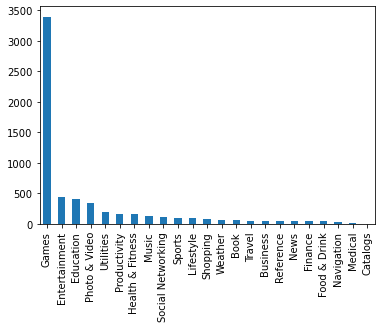

In [41]:
data_en["category"].value_counts().plot(kind="bar")

### GAME vs APP
as you van see above over half of the data consists of games. We will therefore create a model that contains of two classifiers - one that predicts the category GAME vs APP and another that predicts the APP category if it is not a GAME.


In [42]:
data_en["category1"] = np.where(data_en["category"] == "Games","GAME", "APP")

/tmp/ipykernel_62682/1043222523.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_en["category1"] = np.where(data_en["category"] == "Games","GAME", "APP")


In [43]:
data_en.head()

,Unnamed: 0,id,app_name,app_desc,category,language,category1
0,0,281656475,PAC-MAN Premium,"SAVE 20%, now only $3.99 for a limited time!\n...",Games,en,GAME
1,1,281796108,Evernote - stay organized,Let Evernote change the way you organize your ...,Productivity,en,APP
2,2,281940292,"WeatherBug - Local Weather, Radar, Maps, Alerts",Download the most popular free weather app pow...,Weather,en,APP
3,3,282614216,"eBay: Best App to Buy, Sell, Save! Online Shop...",The eBay app is the best way to find anything ...,Shopping,en,APP
4,4,282935706,Bible,On more than 250 million devices around the wo...,Reference,en,APP


In [44]:
stop_words_file = 'stopwords.txt'

stop_words = {}

with open(stop_words_file, "r") as f:
    for line in f:
        stop_words[line.strip()] = None

In [47]:
import string
def preprocess(raw_text):

    text = re.sub("[^a-zA-Z]+", " ", raw_text)
    text = text.lower().split()
    # remove stopwords
    cleaned_words = []
    
    for word in text:
        if word not in stop_words:
            cleaned_words.append(word)

    sen = ' '.join(cleaned_words)

    return sen

In [48]:
data_en["app_desc_clean"] = data_en["app_desc"].swifter.apply(preprocess)

Pandas Apply:   0%|          | 0/6110 [00:00<?, ?it/s]

/tmp/ipykernel_62682/1047804982.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_en["app_desc_clean"] = data_en["app_desc"].swifter.apply(preprocess)


In [49]:
app_desc_clean_list = data_en["app_desc_clean"].tolist()
whole_corpus = " ".join(app_desc_clean_list)
app_desc_clean_list[100]

'cbs sports source mlb nba nfl nhl mls ncaa sports news scores videos one stop sports available iphone ipad apple watch apple tv lightning fast scores stats news tweets push notifications major sports personalized favorite teams plus year long watch live sporting events sec football games sept dec ncaa basketball january april pga tour may august shows jim rome boomer carton fantasy football today fantasy baseball today highlights scores scoreboards real time stats major sports football nfl ncaa high school baseball mlb basketball nba ncaa hockey nhl soccer premier league mls champions league bundesliga la liga serie europa league ligue scottish premier dutch eredivisie mexican primera brazilian serie argentina primera world cup golf pga tennis atp wta auto racing nascar f plus one sports scoreboard shows action world one place follow games one screen personalized push notifications set favorite teams notified scoring updates happen team news alerts first hear breaking news set single 

In [50]:
rare_words = {} # storing it in dictionary instead of list will make looking through it much faster

counter_dic = Counter(whole_corpus.split())

In [51]:
for (key,value) in counter_dic.items():
    if value < 3:
        rare_words[key] = None

In [52]:
len(rare_words)

20745

In [53]:
def delete_rare_words(text):
    words = word_tokenize(text)

    cleaned_words = []
    
    for word in words:
        if word not in rare_words:
            cleaned_words.append(word)
            
    return ' '.join(cleaned_words)

In [54]:
data_en["app_desc_clean"] = data_en["app_desc_clean"].swifter.apply(delete_rare_words)

Pandas Apply:   0%|          | 0/6110 [00:00<?, ?it/s]

/tmp/ipykernel_62682/2310072872.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_en["app_desc_clean"] = data_en["app_desc_clean"].swifter.apply(delete_rare_words)


You may thing - "but "Ebay" is not a dictionary word and might have been deleted". In this project we focus more on user queries that do not contain specific app names, but let's combine the app descriptions with the app names

In [55]:
data_en["app_name_clean"] = data_en["app_name"].swifter.apply(preprocess)
data_en["app_name_desc_clean"] = data_en["app_name_clean"] + " " + data_en["app_desc_clean"]

Pandas Apply:   0%|          | 0/6110 [00:00<?, ?it/s]

/tmp/ipykernel_62682/2824546010.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_en["app_name_clean"] = data_en["app_name"].swifter.apply(preprocess)
/tmp/ipykernel_62682/2824546010.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_en["app_name_desc_clean"] = data_en["app_name_clean"] + " " + data_en["app_desc_clean"]


In [56]:
data_en.head()

,Unnamed: 0,id,app_name,app_desc,category,language,category1,app_desc_clean,app_name_clean,app_name_desc_clean
0,0,281656475,PAC-MAN Premium,"SAVE 20%, now only $3.99 for a limited time!\n...",Games,en,GAME,save limited time one popular video games arca...,pac man premium,pac man premium save limited time one popular ...
1,1,281796108,Evernote - stay organized,Let Evernote change the way you organize your ...,Productivity,en,APP,let evernote change way organize personal prof...,evernote organized,evernote organized let evernote change way org...
2,2,281940292,"WeatherBug - Local Weather, Radar, Maps, Alerts",Download the most popular free weather app pow...,Weather,en,APP,popular weather powered largest professional w...,weatherbug local weather radar maps alerts,weatherbug local weather radar maps alerts pop...
3,3,282614216,"eBay: Best App to Buy, Sell, Save! Online Shop...",The eBay app is the best way to find anything ...,Shopping,en,APP,ebay best way find anything need dresses fashi...,ebay best buy sell save shopping,ebay best buy sell save shopping ebay best way...
4,4,282935706,Bible,On more than 250 million devices around the wo...,Reference,en,APP,million devices around world people reading li...,bible,bible million devices around world people read...


## Let's visualise our data a bit

I will use the binary classification problem APP vs GAME as a showcase to demonstrate class separation and feature importance

In [57]:
possible_labels = data_en.category1.unique()

label_dict = {}
for index, possible_label in enumerate(possible_labels):
    label_dict[possible_label] = index
label_dict

{'GAME': 0, 'APP': 1}

In [58]:
data_en['cat1'] = data_en.category1.replace(label_dict)

/tmp/ipykernel_62682/4098744807.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_en['cat1'] = data_en.category1.replace(label_dict)


In [59]:
#save it so you can later upload it into Colab after you realise that your cpu cant handle BERT even with batch size 1
data_en.to_csv("applestore_data_cleaned.csv")

#data_en = pd.read_csv("applestore_data_cleaned.csv")

Ok, remember that our testing data looks very different from our training data? I have created a small test set of some example queries

In [179]:
test_df = pd.read_csv("testing_data.csv")

In [61]:
test_df['category_1'] = test_df.category_1.replace(label_dict)

In [62]:

list_corpus = data_en["app_name_desc_clean"].tolist()
list_labels_cat1 = data_en["cat1"].tolist()

test_df["user_query"] = test_df["user_query"].swifter.apply(preprocess)
test_corpus = test_df["user_query"].tolist()
test_labels_cat1 = test_df["category_1"].tolist()

Pandas Apply:   0%|          | 0/181 [00:00<?, ?it/s]

<AxesSubplot:>

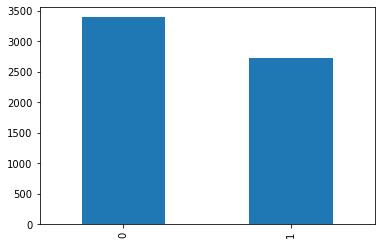

In [63]:
data_en["cat1"].value_counts().plot(kind="bar")

In [102]:

#could cretae validation set but given the validation data would, again, be different from test data, lets skip hyperparameter tuning
#X_train, X_test, y_train, y_test = train_test_split(list_corpus, list_labels, test_size=0.2,random_state=40)

count_vectorizer = CountVectorizer(ngram_range=(1,2),binary=True)

X_train, X_test = list_corpus, test_corpus
y_train, y_test = list_labels_cat1, test_labels_cat1

X_train_counts = count_vectorizer.fit_transform(X_train)
X_test_counts = count_vectorizer.transform(X_test)

In [103]:
import matplotlib
import matplotlib.patches as mpatches

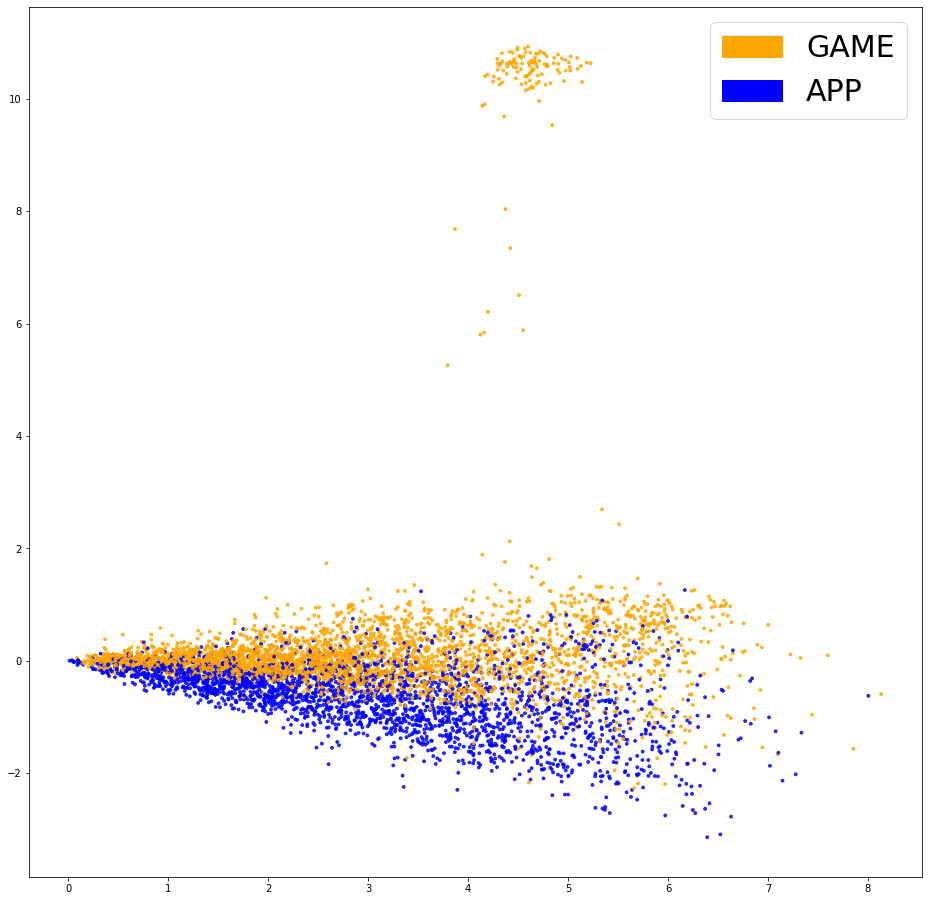

In [104]:

def plot_LSA(test_data, test_labels, savepath="LSA_demo.csv", plot=True):
        lsa = TruncatedSVD(n_components=2)
        lsa.fit(test_data)
        lsa_scores = lsa.transform(test_data)
        color_mapper = {label:idx for idx,label in enumerate(set(test_labels))}
        color_column = [color_mapper[label] for label in test_labels]
        colors = ['orange','blue']
        if plot:
            plt.scatter(lsa_scores[:,0], lsa_scores[:,1], s=8, alpha=.8, c=test_labels, cmap=matplotlib.colors.ListedColormap(colors))
            orange_patch = mpatches.Patch(color='orange', label='GAME')
            blue_patch = mpatches.Patch(color='blue', label='APP')
            plt.legend(handles=[orange_patch, blue_patch], prop={'size': 30})


fig = plt.figure(figsize=(16, 16))          
plot_LSA(X_train_counts, y_train)
plt.show()

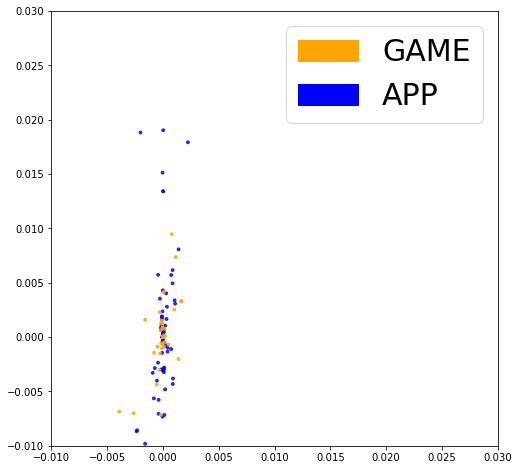

In [105]:
fig = plt.figure(figsize=(8, 8))          
plot_LSA(X_test_counts, y_test)
plt.axis([-0.01, 0.03, -0.01, 0.03])
plt.show()


## Model choice
I will leave it as an exercise for you to think about why about why a generative model like Naive Bayes works better than a discriminative like a logistic regression

In [110]:
clf = MultinomialNB() 
clf.fit(X_train_counts, y_train)

y_predicted_counts = clf.predict(X_test_counts)

In [111]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report

def get_metrics(y_test, y_predicted):  
    # true positives / (true positives+false positives)
    precision = precision_score(y_test, y_predicted, pos_label=None,
                                    average='weighted')             
    # true positives / (true positives + false negatives)
    recall = recall_score(y_test, y_predicted, pos_label=None,
                              average='weighted')
    
    # harmonic mean of precision and recall
    f1 = f1_score(y_test, y_predicted, pos_label=None, average='weighted')
    
    # true positives + true negatives/ total
    accuracy = accuracy_score(y_test, y_predicted)
    return accuracy, precision, recall, f1


accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_counts)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))



accuracy = 0.890, precision = 0.895, recall = 0.890, f1 = 0.890


as you can see distinguishing an APP from a GAME is pretty straight forward with almost 89% accuracy. 
(when testing it on app descriptions aka longer text, accuracy increases to 95% - distinguishing apps from games is not too difficult)

In [90]:

import itertools
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.winter):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=30)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize=20)
    plt.yticks(tick_marks, classes, fontsize=20)
    
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", 
                 color="white" if cm[i, j] < thresh else "black", fontsize=40)
    
    plt.tight_layout()
    plt.ylabel('True label', fontsize=30)
    plt.xlabel('Predicted label', fontsize=30)

    return plt



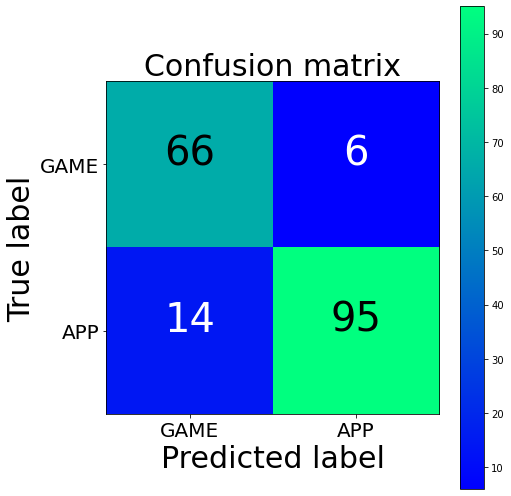

[[66  6]
 [14 95]]


In [91]:
cm = confusion_matrix(y_test, y_predicted_counts)
fig = plt.figure(figsize=(7, 7))
plot = plot_confusion_matrix(cm, classes=['GAME','APP'], normalize=False, title='Confusion matrix')
plt.show()
print(cm)

In [92]:
test_df["pred"] = y_predicted_counts

In [94]:
test_df[test_df.category_1 != test_df.pred]

,user_query,category_2,category_1,pred
6,whip sound,Entertainment,1,0
13,brain teasers,Education,1,0
16,practice languages,Education,1,0
18,driving test,Education,1,0
28,speed test,Utilities,1,0
56,facebook,Social Networking,1,0
60,chat,Social Networking,1,0
67,paris marathon,Sports,1,0
69,livescores,Sports,1,0
75,buy clothes,Shopping,1,0


## Coefficients
Let's have a look at the coefficients from the most important features (words) when making the decision. Maybe it can help us to design a new dataset with short queries which can be used to train the model, instead of using the long app descriptions

In [142]:
def get_most_important_features(vectorizer, model, n=5):
    index_to_word = {v:k for k,v in vectorizer.vocabulary_.items()}
    
    # loop for each class
    classes ={}

    for class_index in range(model.coef_.shape[0]):
        word_importances = [(el, index_to_word[i]) for i,el in enumerate(model.coef_[class_index])]
        sorted_coeff = sorted(word_importances, key = lambda x : x[0], reverse=True)
        tops = sorted(sorted_coeff[:n], key = lambda x : x[0])
        bottom = sorted_coeff[-n:]
        classes = {
            'tops':tops,
            'bottom':bottom
        }
    return classes

importance = get_most_important_features(count_vectorizer, clf, 10)

In [143]:
importance

{'tops': [(-7.309662163529797, 'best'),
  (-7.309662163529797, 'iphone'),
  (-7.296590081962443, 'share'),
  (-7.2542108589935825, 'one'),
  (-7.19970695649366, 'like'),
  (-7.048648338160177, 'time'),
  (-7.015422690531857, 'new'),
  (-7.0072859491387955, 'com'),
  (-6.85359844671676, 'use'),
  (-6.820113938211091, 'features')],
 'bottom': [(-14.125302153604128, 'zynga looney'),
  (-14.125302153604128, 'zynga privacy'),
  (-14.125302153604128, 'zynga runners'),
  (-14.125302153604128, 'zynga solitaire'),
  (-14.125302153604128, 'zynga terms'),
  (-14.125302153604128, 'zynga tm'),
  (-14.125302153604128, 'zynga uses'),
  (-14.125302153604128, 'zyon'),
  (-14.125302153604128, 'zyon https'),
  (-14.125302153604128, 'zyon rhythmgame')]}

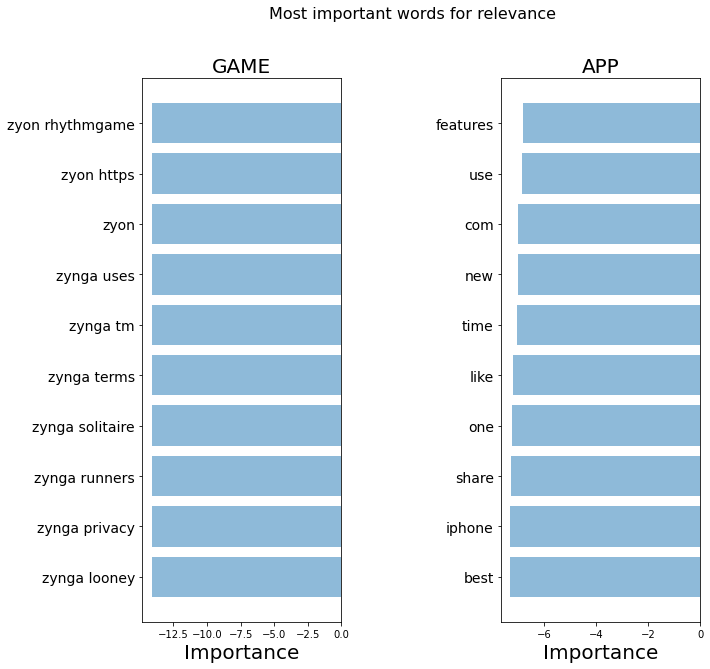

In [144]:
def plot_important_words(top_scores, top_words, bottom_scores, bottom_words, name):
    y_pos = np.arange(len(top_words))
    top_pairs = [(a,b) for a,b in zip(top_words, top_scores)]
    top_pairs = sorted(top_pairs, key=lambda x: x[1])
    
    bottom_pairs = [(a,b) for a,b in zip(bottom_words, bottom_scores)]
    bottom_pairs = sorted(bottom_pairs, key=lambda x: x[1], reverse=True)
    
    top_words = [a[0] for a in top_pairs]
    top_scores = [a[1] for a in top_pairs]
    
    bottom_words = [a[0] for a in bottom_pairs]
    bottom_scores = [a[1] for a in bottom_pairs]
    
    fig = plt.figure(figsize=(10, 10))  

    plt.subplot(121)
    plt.barh(y_pos,bottom_scores, align='center', alpha=0.5)
    plt.title('GAME', fontsize=20)
    plt.yticks(y_pos, bottom_words, fontsize=14)
    plt.suptitle('Key words', fontsize=16)
    plt.xlabel('Importance', fontsize=20)
    
    plt.subplot(122)
    plt.barh(y_pos,top_scores, align='center', alpha=0.5)
    plt.title('APP', fontsize=20)
    plt.yticks(y_pos, top_words, fontsize=14)
    plt.suptitle(name, fontsize=16)
    plt.xlabel('Importance', fontsize=20)
    
    plt.subplots_adjust(wspace=0.8)
    plt.show()

top_scores = [a[0] for a in importance['tops']]
top_words = [a[1] for a in importance['tops']]
bottom_scores = [a[0] for a in importance['bottom']]
bottom_words = [a[1] for a in importance['bottom']]

plot_important_words(top_scores, top_words, bottom_scores, bottom_words, "Most important words for relevance")

Some of the most important words dont tell us much actually. However, if you add them to the stopwords, results remain the same. Feel free to play around with it. 

In [123]:
from lime import lime_text

explainer = lime_text.LimeTextExplainer(class_names=["GAME", "APP"])
explainer

In [124]:
def pred_fn(text):
    text_transformed = count_vectorizer.transform(text)
    return clf.predict_proba(text_transformed)

pred_fn([X_test[0]])

array([[0.19035643, 0.80964357]])

In [125]:
import random
idx = random.randint(1, len(X_test))

In [126]:
print("Actual Text : ", X_test[idx])

Actual Text :  paris marathon


In [127]:
len( X_test[idx].split())

2

In [128]:
print("Prediction : ", clf.predict(X_test_counts[idx].reshape(1,-1))[0])

Prediction :  0


In [129]:
explanation = explainer.explain_instance(X_test[idx], classifier_fn=pred_fn)

explanation.show_in_notebook()

In [130]:
explanation = explainer.explain_instance("cool adventure game", classifier_fn=pred_fn)

explanation.show_in_notebook()

In [131]:
explanation = explainer.explain_instance("word to pdf converter", classifier_fn=pred_fn)

explanation.show_in_notebook()

In [132]:
explanation = explainer.explain_instance("video call", classifier_fn=pred_fn)

explanation.show_in_notebook()

In [133]:
explanation = explainer.explain_instance("filter", classifier_fn=pred_fn)

explanation.show_in_notebook() #note that the descriptions are lemmatised so user query would need to be lemmatised too

In [134]:
explanation = explainer.explain_instance("dating app", classifier_fn=pred_fn)

explanation.show_in_notebook()

In [135]:
explanation = explainer.explain_instance("note taking", classifier_fn=pred_fn)

explanation.show_in_notebook()

In [145]:
explanation = explainer.explain_instance("facebook", classifier_fn=pred_fn)

explanation.show_in_notebook()

## Let's try BERT
see next notebook

# RESULTS (for classification of category1 based on app description)

Both models perform equall good on the small test set (f1 score 0.89 for NB and 0.87 for BERT). Both models make different kinds of mistakes. Obviously BERT takes much longer to train than NB (over 20minutes vs a couple of seconds). However, given how different the training data is from the testing data, I expected BERT to perform worse. Now it is time to deal with category 2 for APPS

In [148]:
data_en = pd.read_csv("applestore_data_cleaned.csv")
data_en_nogame = data_en[data_en.category != "Games"]

possible_labels = data_en_nogame.category.unique()

label_dict = {}
for index, possible_label in enumerate(possible_labels):
    label_dict[possible_label] = index
label_dict

{'Productivity': 0,
 'Weather': 1,
 'Shopping': 2,
 'Reference': 3,
 'Finance': 4,
 'Music': 5,
 'Utilities': 6,
 'Travel': 7,
 'Social Networking': 8,
 'Sports': 9,
 'Business': 10,
 'Health & Fitness': 11,
 'Entertainment': 12,
 'Photo & Video': 13,
 'Navigation': 14,
 'Education': 15,
 'Lifestyle': 16,
 'Food & Drink': 17,
 'News': 18,
 'Book': 19,
 'Medical': 20,
 'Catalogs': 21}

In [149]:
keys = []
for (key,val) in label_dict.items():
    keys.append(key)

keys

['Productivity',
 'Weather',
 'Shopping',
 'Reference',
 'Finance',
 'Music',
 'Utilities',
 'Travel',
 'Social Networking',
 'Sports',
 'Business',
 'Health & Fitness',
 'Entertainment',
 'Photo & Video',
 'Navigation',
 'Education',
 'Lifestyle',
 'Food & Drink',
 'News',
 'Book',
 'Medical',
 'Catalogs']

<AxesSubplot:>

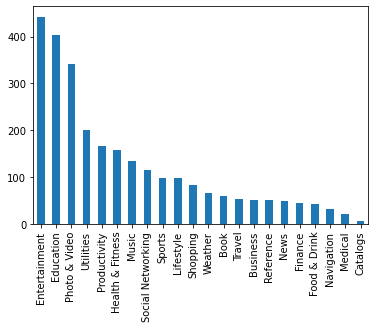

In [176]:
data_en_nogame["category"].value_counts().plot(kind="bar")

In [162]:
clf = MultinomialNB()

In [188]:
data_en = data_en[data_en.category != "Games"]

In [189]:
test_df['category_2_label'] = test_df.category_2.replace(label_dict)
data_en['category_2_label'] = data_en.category.replace(label_dict)

list_corpus = data_en["app_name_desc_clean"].tolist()
list_labels_cat2= data_en["category_2_label"].tolist()

test_corpus = test_df["user_query"].tolist()
test_labels_cat2 = test_df["category_2_label"].tolist()

count_vectorizer = CountVectorizer(ngram_range=(1,1),binary=True)

X_train, X_test = list_corpus, test_corpus
y_train, y_test = list_labels_cat2, test_labels_cat2

X_train_counts = count_vectorizer.fit_transform(X_train)
X_test_counts = count_vectorizer.transform(X_test)  

/tmp/ipykernel_62682/46794506.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_en['category_2_label'] = data_en.category.replace(label_dict)


In [190]:
data_en.head()

,Unnamed: 0,Unnamed: 0.1,id,app_name,app_desc,category,language,category1,app_desc_clean,app_name_clean,app_name_desc_clean,cat1,category_2_label
1,1,1,281796108,Evernote - stay organized,Let Evernote change the way you organize your ...,Productivity,en,APP,let evernote change way organize personal prof...,evernote organized,evernote organized let evernote change way org...,1,0
2,2,2,281940292,"WeatherBug - Local Weather, Radar, Maps, Alerts",Download the most popular free weather app pow...,Weather,en,APP,popular weather powered largest professional w...,weatherbug local weather radar maps alerts,weatherbug local weather radar maps alerts pop...,1,1
3,3,3,282614216,"eBay: Best App to Buy, Sell, Save! Online Shop...",The eBay app is the best way to find anything ...,Shopping,en,APP,ebay best way find anything need dresses fashi...,ebay best buy sell save shopping,ebay best buy sell save shopping ebay best way...,1,2
4,4,4,282935706,Bible,On more than 250 million devices around the wo...,Reference,en,APP,million devices around world people reading li...,bible,bible million devices around world people read...,1,3
6,6,6,283646709,PayPal - Send and request money safely,Description\nTAP INTO YOUR MONEY\nSend money o...,Finance,en,APP,description tap money send money pay almost an...,paypal send request money safely,paypal send request money safely description t...,1,4


In [191]:

clf.fit(X_train_counts, y_train)

MultinomialNB()

In [192]:
y_predicted_counts = clf.predict(X_test_counts)
accuracy, precision, recall, f1 = get_metrics(y_test, y_predicted_counts)
print("accuracy = %.3f, precision = %.3f, recall = %.3f, f1 = %.3f" % (accuracy, precision, recall, f1))


accuracy = 0.679, precision = 0.711, recall = 0.679, f1 = 0.652


/home/user/anaconda3/envs/nlp2021/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [193]:
test_df["pred_2"] = y_predicted_counts

In [195]:
test_df[test_df.category_2_label != test_df.pred_2]

,user_query,category_2,category_1,category_2_label,pred_2
1,funny face filter,Entertainment,1,12,13
9,karaoke,Entertainment,1,12,5
10,TED videos,Education,1,15,12
28,speed test,Utilities,1,6,15
30,russian keyboard,Utilities,1,6,12
31,compass,Utilities,1,6,15
33,sound recorder,Utilities,1,6,5
40,take notes,Productivity,1,0,15
45,running app,Health & Fitness,1,11,12
51,car radio,Music,1,5,12


## Results after BERT

so Bert for category 2 is only 32% accuracy and an F1 score of 0.28 compared do Naive Bayes of 68% accuracy and 0.65 F1 score. This is not surprising given the difference of training and testing data and the ambiguitiy in the category 2 data